In [1]:
# @title library installs
!pip install --upgrade networkx scipy scprep

In [2]:
# @title 3d plotting
import scprep
import matplotlib.pyplot as plt # plotting
from mpl_toolkits.mplot3d import Axes3D
def network_plot_3D(G, angle=0.0, save=False, colors=None):
    # Get node positions
    pos = nx.get_node_attributes(G, 'pos')
    # Get number of nodes
    n = G.number_of_nodes()
    # Get the maximum number of edges adjacent to a single node
    edge_max = max([G.degree(i) for i in range(n)])
    # Define color range proportional to number of edges adjacent to a single node
    #colors = [plt.cm.plasma(G.degree(i)/edge_max) for i in range(n)]

    # 3D network plot
    with plt.style.context(('ggplot')):

        fig = plt.figure(figsize=(10,9))
        ax = plt.axes(projection ='3d')#Axes3D(fig)

        # Loop on the pos dictionary to extract the x,y,z coordinates of each node
        zis = np.array([v[-1] for v in pos.items()])
        zmin = zis.min()
        zmax = zis.max()
        for key, value in pos.items():
            xi = value[0]
            yi = value[1]
            zi = value[2]

            # Scatter plot
            alph = (0.3 + (zi - zmin)/(zmax - zmin) * 0.7)
            if colors is not None:
              ax.scatter(xi, yi, zi, c=["gray","black"][colors[key]], s=20+20*G.degree(key), edgecolors='k', alpha=alph)
            else:
              ax.scatter(xi, yi, zi, c="gray", s=20+20*G.degree(key), edgecolors='k', alpha=alph)

        # Loop on the list of edges to get the x,y,z, coordinates of the connected nodes
        # Those two points are the extrema of the line to be plotted
        for i,j in enumerate(G.edges()):
            x = np.array((pos[j[0]][0], pos[j[1]][0]))
            y = np.array((pos[j[0]][1], pos[j[1]][1]))
            z = np.array((pos[j[0]][2], pos[j[1]][2]))

        # Plot the connecting lines
            ax.plot(x, y, z, c='black', alpha=0.5)

    # Set the initial view
    ax.view_init(30, angle)
    # Hide the axes
    #ax.set_axis_off()
    if save is not False:
      plt.savefig("plot.png")
      plt.close('all')
    else:
      plt.show()

    return

In [3]:
"""imports """
import networkx as nx # graphs
import numpy as np # linear algebra
import cvxpy as cp # convex optimization

import random

In [4]:
def dict_to_arr(A):
    idx = np.array(list(A.keys()))
    val = np.array(list(A.values()))

    n = idx.max(0)+1
    out = np.zeros_like(val)
    out[idx] = val
    return out

In [5]:
"""generate graph and get positions"""
n = 100
m=3
p = 0.3
seed = 896803
np.random.seed(seed=seed)
n_fixed = 20
n_free = n - n_fixed
G = nx.random_geometric_graph(n, p, seed=seed, dim=3)
# position is stored as node attribute data for random_geometric_graph
pos = nx.get_node_attributes(G, "pos")
c = np.array([x for x in pos.values()]).mean(0)
pos = dict([(k, v - c) for k,v in pos.items()])
nx.set_node_attributes(G, pos, name="pos")

In [6]:
"""graph laplacian and ground-truth positions (centered) """
X = X0 = dict_to_arr(pos)
L = nx.laplacian_matrix(G).todense()
L.shape

(100, 100)

In [7]:
"""sample fixed nodes """
random_node_indices = np.random.choice(np.arange(n),n_fixed,replace=False)
fixed_mask = np.zeros(n, bool)
fixed_mask[random_node_indices] = 1
free_mask = ~fixed_mask

<ipython-input-2-c6c9276f4fad>:33: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  ax.scatter(xi, yi, zi, c=["gray","black"][colors[key]], s=20+20*G.degree(key), edgecolors='k', alpha=alph)


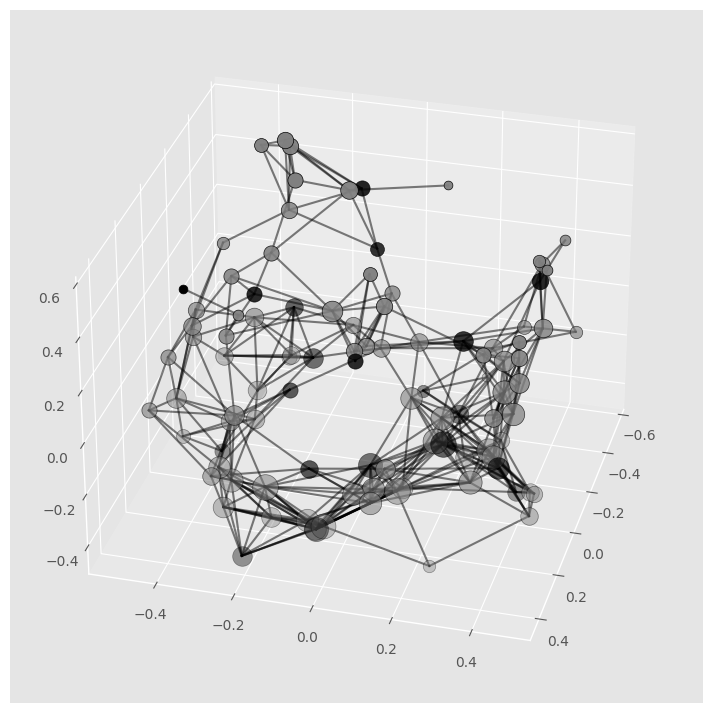

In [8]:
"""plot ground truth """
network_plot_3D(G, angle=15.0, colors=fixed_mask, save=False)

In [9]:
"""generate problem parameters"""
B = L[free_mask][:,fixed_mask]@X0[fixed_mask]
L_free = L[free_mask][:,free_mask]

def _sqrtm(C):
    # Computing diagonalization
    evalues, evectors = np.linalg.eig(C)
    # Ensuring square root matrix exists
    sqrt_matrix = evectors @ np.diag(np.sqrt(evalues)) @ np.linalg.inv(evectors)
    return sqrt_matrix

L_free_sqrt = _sqrtm(L_free)

In [10]:
"""set up problem """
r2 = 10
X_var = cp.Variable((n_free,m))

def cp_matrix_inner(A, B):
  return cp.trace(A.T@B)

prob = cp.Problem(cp.Minimize(cp.square(cp.norm(L_free_sqrt@X_var, 'fro')) + 2*cp_matrix_inner(X_var, B)),
                  [cp.square(cp.norm(X_var,'fro')) <= r2, cp.sum(X_var, axis=0) == 0])

In [11]:
"""solve problem """
prob.solve()

-17.635221328005287

In [12]:
"""map back coordinates """
X_sol = np.zeros_like(X)
X_sol[fixed_mask] = X[fixed_mask]
X_sol[free_mask] = X_var.value

<ipython-input-2-c6c9276f4fad>:33: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  ax.scatter(xi, yi, zi, c=["gray","black"][colors[key]], s=20+20*G.degree(key), edgecolors='k', alpha=alph)


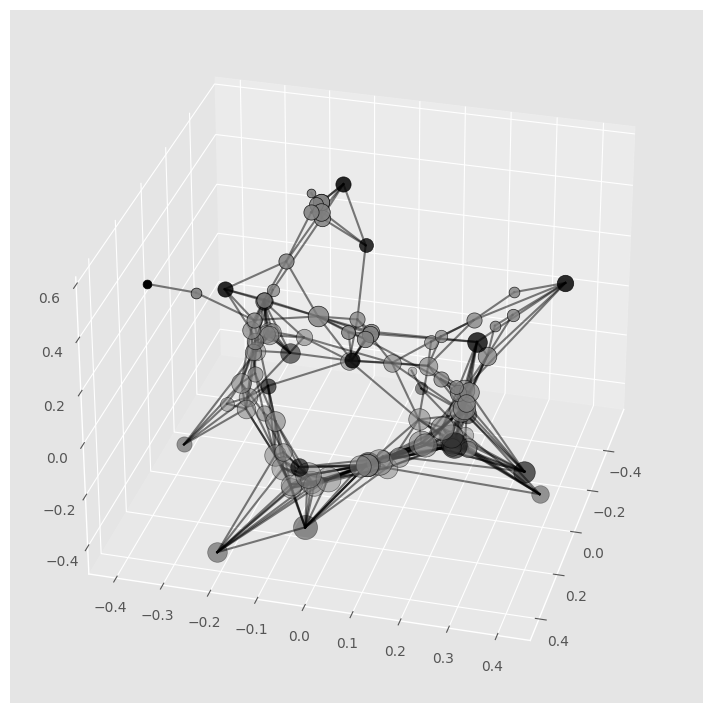

In [13]:
"""plot solution """
pos = dict([(k, X_sol[k]) for k,v in pos.items()])
nx.set_node_attributes(G, pos, name="pos")
network_plot_3D(G, angle=15.0, colors=fixed_mask, save=False)

In [14]:
"""animation """
scprep.plot.rotate_scatter3d(X_sol, c=free_mask, cmap="gray", title="optimized vertex embeddings")